In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
from plotly import tools
from plotly.offline import init_notebook_mode,iplot

C:\Users\91974\anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
data=pd.read_csv('mushrooms.csv')

In [3]:
data

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,...,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,p,x,s,n,t,p,f,c,n,k,...,s,w,w,p,w,o,p,k,s,u
1,e,x,s,y,t,a,f,c,b,k,...,s,w,w,p,w,o,p,n,n,g
2,e,b,s,w,t,l,f,c,b,n,...,s,w,w,p,w,o,p,n,n,m
3,p,x,y,w,t,p,f,c,n,n,...,s,w,w,p,w,o,p,k,s,u
4,e,x,s,g,f,n,f,w,b,k,...,s,w,w,p,w,o,e,n,a,g
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8119,e,k,s,n,f,n,a,c,b,y,...,s,o,o,p,o,o,p,b,c,l
8120,e,x,s,n,f,n,a,c,b,y,...,s,o,o,p,n,o,p,b,v,l
8121,e,f,s,n,f,n,a,c,b,n,...,s,o,o,p,o,o,p,b,c,l
8122,p,k,y,n,f,y,f,c,n,b,...,k,w,w,p,w,o,e,w,v,l


In [4]:
data.shape

(8124, 23)

In [27]:
data.isnull().sum()

class                       0
cap-shape                   0
cap-surface                 0
cap-color                   0
bruises                     0
odor                        0
gill-attachment             0
gill-spacing                0
gill-size                   0
gill-color                  0
stalk-shape                 0
stalk-root                  0
stalk-surface-above-ring    0
stalk-surface-below-ring    0
stalk-color-above-ring      0
stalk-color-below-ring      0
veil-type                   0
veil-color                  0
ring-number                 0
ring-type                   0
spore-print-color           0
population                  0
habitat                     0
dtype: int64

In [31]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8124 entries, 0 to 8123
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   class                     8124 non-null   object
 1   cap-shape                 8124 non-null   object
 2   cap-surface               8124 non-null   object
 3   cap-color                 8124 non-null   object
 4   bruises                   8124 non-null   object
 5   odor                      8124 non-null   object
 6   gill-attachment           8124 non-null   object
 7   gill-spacing              8124 non-null   object
 8   gill-size                 8124 non-null   object
 9   gill-color                8124 non-null   object
 10  stalk-shape               8124 non-null   object
 11  stalk-root                8124 non-null   object
 12  stalk-surface-above-ring  8124 non-null   object
 13  stalk-surface-below-ring  8124 non-null   object
 14  stalk-color-above-ring  

In [6]:
data.describe()

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,...,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
count,8124,8124,8124,8124,8124,8124,8124,8124,8124,8124,...,8124,8124,8124,8124,8124,8124,8124,8124,8124,8124
unique,2,6,4,10,2,9,2,2,2,12,...,4,9,9,1,4,3,5,9,6,7
top,e,x,y,n,f,n,f,c,b,b,...,s,w,w,p,w,o,p,w,v,d
freq,4208,3656,3244,2284,4748,3528,7914,6812,5612,1728,...,4936,4464,4384,8124,7924,7488,3968,2388,4040,3148


The below step is not necessary but it might be helpful to understand the labels ahead

In [8]:
capshape={"b":"bell","c":"conical","x":"convex","f":"flat","k":"knobbed","s":"sunken"}
data["cap-shape"]=data["cap-shape"].replace(capshape)

capsurface={"f": "fibrous", "g": "grooves","y":"scaly","s": "smooth"}
data["cap-surface"]=data["cap-surface"].replace(capsurface)

capcolor={"n":"brown","b":"buff","c":"cinnamon","g":"gray","r":"green","p":"pink","u":"purple","e":"red","w":"white","y":"yellow"}
data["cap-color"]=data["cap-color"].replace(capcolor)

odor={"a":"almond","l":"anise","c":"creosote","y":"fishy","f":"foul","m":"musty","n":"none","p":"pungent","s":"spicy"}
data["odor"]=data["odor"].replace(odor)

gillattachment={"a":"attached","f":"free"}
data["gill-attachment"]=data["gill-attachment"].replace(gillattachment)

gillspacing={"c":"close","w":"crowded"}
data["gill-spacing"]=data["gill-spacing"].replace(gillspacing)

gillsize={"b":"broad","n":"narrow"}
data["gill-size"]=data["gill-size"].replace(gillsize)

gillcolor={"k":"black","b":"buff","n":"brown","h":"chocolate","g":"gray","r":"green","o":"orange","p":"pink","u":"purple","e":"red","w":"white","y":"yellow"}
data["gill-color"]=data["gill-color"].replace(gillcolor)

stalkshape={"t":"tapering","e":"enlarging"}
data["stalk-shape"]=data["stalk-shape"].replace(stalkshape)

stalkroot={"b":"bulbous","c":"club","e":"equal","z":"rhizomorphs","r":"rooted","?":"missing"}
data["stalk-root"]=data["stalk-root"].replace(stalkroot)

stalksurface={"s":"smooth","k":"silky","f":"fibrous","y":"scaly"}
data["stalk-surface-above-ring"]=data["stalk-surface-above-ring"].replace(stalksurface)
data["stalk-surface-below-ring"]=data["stalk-surface-below-ring"].replace(stalksurface)

stalkcolor ={"n":"brown","b":"buff","c":"cinnamon","g":"gray","p":"pink","e":"red","w":"white","y":"yellow","o":"orange"}
data["stalk-color-above-ring"]=data["stalk-color-above-ring"].replace(stalkcolor)
data["stalk-color-below-ring"]=data["stalk-color-below-ring"].replace(stalkcolor)

veiltype={"p":"partial","u":"universal"} 
data["veil-type"]=data["veil-type"].replace(veiltype)

veilcolor={"n":"brown","o":"orange","w":"white","y":"yellow"} 
data["veil-color"]=data["veil-color"].replace(veilcolor)

ringnumber= {"n":"none","o":"one","t":"two"}
data["ring-number"]=data["ring-number"].replace(ringnumber)

ringtype={"c":"cobwebby","e":"evanescent","f":"flaring","l":"large","n":"none","p":"pendant","s":"sheathing","z":"zone"}
data["ring-type"]=data["ring-type"].replace(ringtype)

sporeprintcolor= {"k":"black","n":"brown","b":"buff","h":"chocolate","r":"green","o":"orange","u":"purple","w":"white","y":"yellow"}
data["spore-print-color"]=data["spore-print-color"].replace(sporeprintcolor)

population={"a":"abundant","c":"clustered","n":"numerous","s":"scattered","v":"several","y":"solitary"}
data["population"]=data["population"].replace(population)

habitat={"g":"grasses","l":"leaves","m":"meadows","p":"paths","u":"urban","w":"waste","d":"woods"}
data["habitat"]=data["habitat"].replace(habitat)

bruises={"t":"bruises","f":"no"}
data["bruises"]=data["bruises"].replace(bruises)

In [9]:
data.head()

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,...,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,p,convex,smooth,brown,bruises,pungent,free,close,narrow,black,...,smooth,white,white,partial,white,one,pendant,black,scattered,urban
1,e,convex,smooth,yellow,bruises,almond,free,close,broad,black,...,smooth,white,white,partial,white,one,pendant,brown,numerous,grasses
2,e,bell,smooth,white,bruises,anise,free,close,broad,brown,...,smooth,white,white,partial,white,one,pendant,brown,numerous,meadows
3,p,convex,scaly,white,bruises,pungent,free,close,narrow,brown,...,smooth,white,white,partial,white,one,pendant,black,scattered,urban
4,e,convex,smooth,gray,no,none,free,crowded,broad,black,...,smooth,white,white,partial,white,one,evanescent,brown,abundant,grasses


In [15]:
def plot_column(x, y):
    plt.figure(figsize=(12, 6))                   
    plt.legend(['Poisonous', 'Edible'], loc='upper right')
    plt.ylabel('Number of the Mushrooms', fontsize=14)
    plt.xlabel('Types of the Cap Shapes of the Mushrooms', fontsize=14)
    plt.title(f'Edible or Poisonous Based on {y}', fontsize=20)
    plotcolumn = sns.countplot(data=data, x=x ,hue='class',order=x.value_counts().index, palette=['red', 'lightgreen'])                     
    for p in plotcolumn.patches:
        plotcolumn.annotate(format(p.get_height(), '.1f'),
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center', va='center')

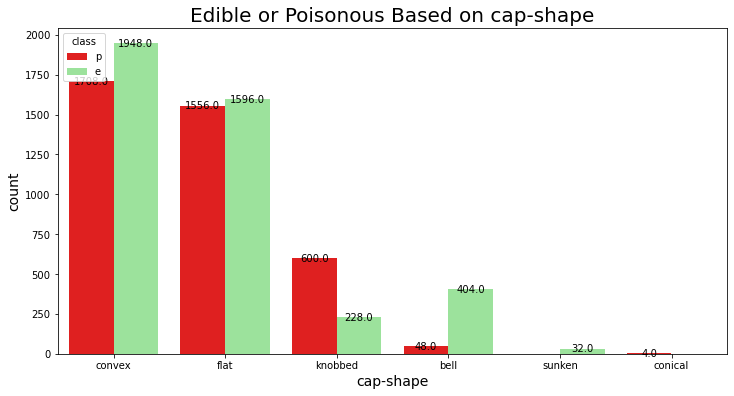

In [16]:
plot_column(data['cap-shape'], 'cap-shape')

C:\Users\91974\AppData\Local\Temp/ipykernel_41944/2345936714.py:2: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



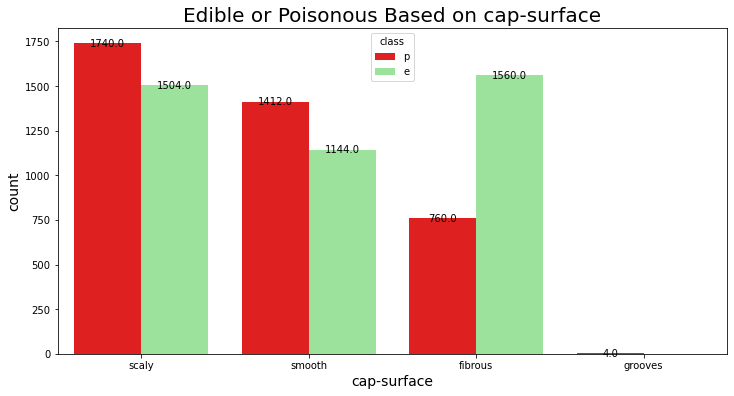

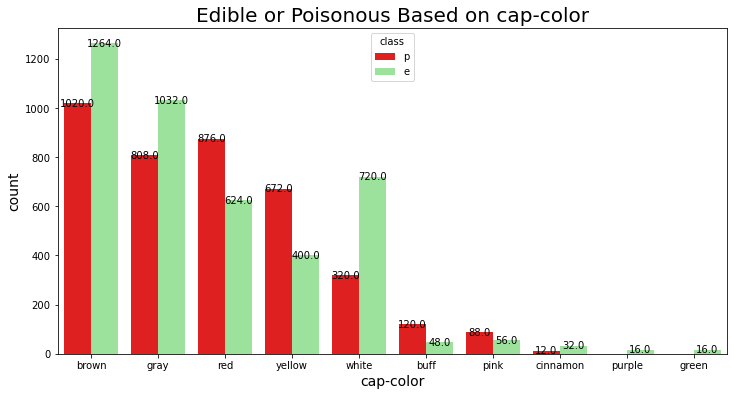

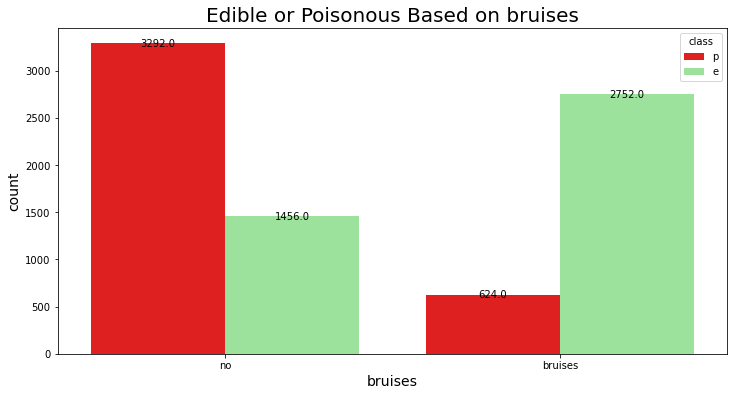

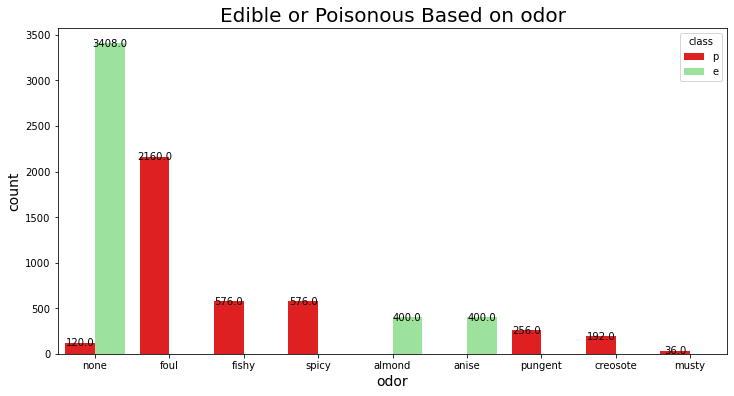

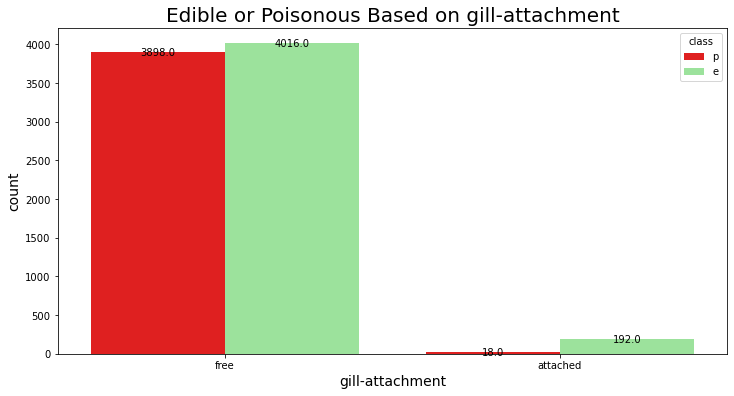

...

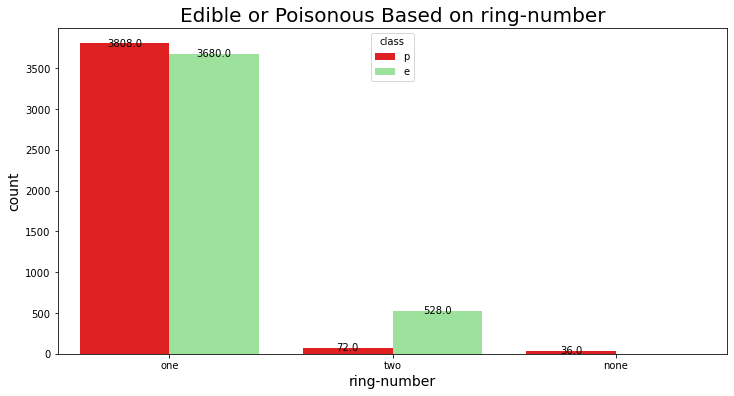

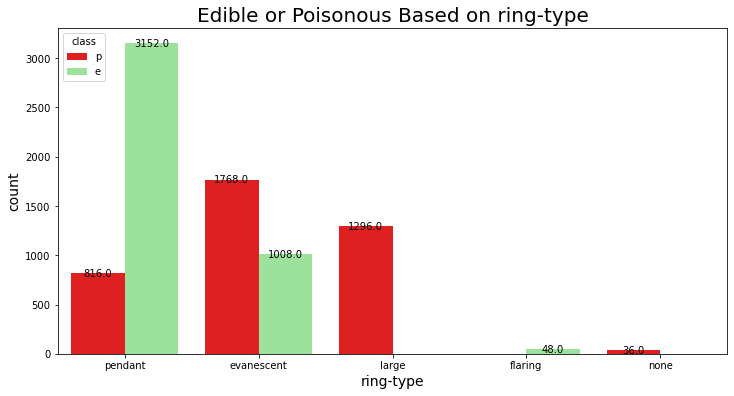

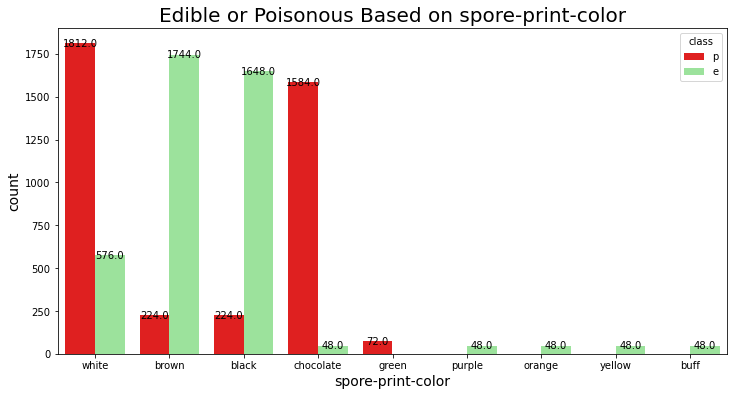

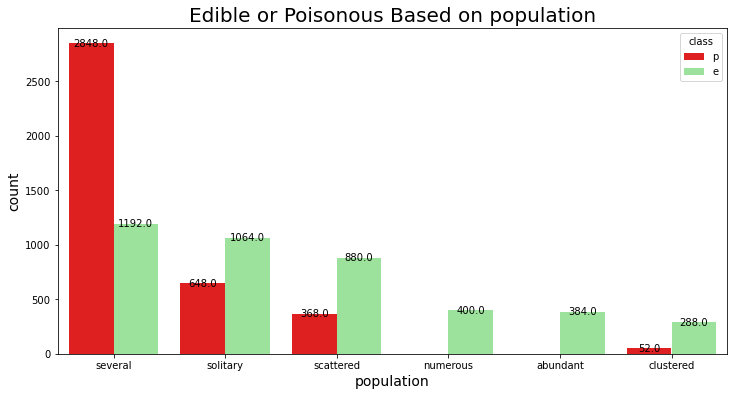

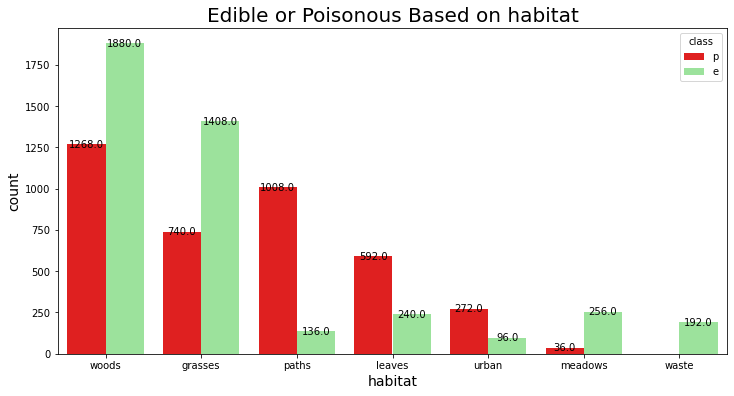

In [17]:
cols = ['cap-surface', 'cap-color', 'bruises', 'odor',
       'gill-attachment', 'gill-spacing', 'gill-size', 'gill-color',
       'stalk-shape', 'stalk-root', 'stalk-surface-above-ring',
       'stalk-surface-below-ring', 'stalk-color-above-ring',
       'stalk-color-below-ring', 'veil-type', 'veil-color', 'ring-number','ring-type', 'spore-print-color', 'population', 'habitat']
for col in cols:
    plot_column(data[col], col)

The below diagram represents the relation between various cap qualities contributing towards edibility of mushroom

In [20]:
classep_dim = go.parcats.Dimension(
    values=data["class"].values,
    label="Mushroom Types",
    categoryarray=["e", "p"],
    ticktext=['edible', 'poisonous']
)

cap_shape_dim = go.parcats.Dimension(
    values=data["cap-shape"].values,
    label="Cap Shape"
)

cap_surface_dim = go.parcats.Dimension(
  values=data["cap-surface"].values,
  label="Cap Surface"
)
cap_color_dim = go.parcats.Dimension(
  values=data["cap-color"].values,
  label="Cap Color"
)

# Create parcats trace
color = [1 if i=="e" else 0 for i in data["class"]]
colorscale = [[0, 'lightcoral'], [1, 'mediumseagreen']];
data1 = [
    go.Parcats(
        dimensions=[classep_dim,cap_surface_dim,cap_shape_dim,cap_color_dim],
        line={'color': color,
              'colorscale': colorscale},
        hoveron='dimension',
        hoverinfo='count+probability',
        labelfont={'size': 18, 'family': 'Times'},
        tickfont={'size': 16, 'family': 'Times'},
        arrangement='fixed',
    )

]


iplot(data1)


The below diagram represents the relation between various gill qualities contributing towards edibility of mushroom

In [22]:
gill_attachment_dim = go.parcats.Dimension(
    values=data["gill-attachment"].values,
    label="Gill Attachment"
)

gill_spacing_dim = go.parcats.Dimension(
  values=data["gill-spacing"].values,
  label="Gill Spacing"
)
gill_size_dim = go.parcats.Dimension(
  values=data["gill-size"].values,
  label="Gill Size"
)
gill_color_dim = go.parcats.Dimension(
  values=data["gill-color"].values,
  label="Gill Color"
)

# Create parcats trace
color = [1 if i=="e" else 0 for i in data["class"]]
colorscale = [[0, 'lightcoral'], [1, 'mediumseagreen']];
data2 = [
    go.Parcats(
        dimensions=[classep_dim,gill_attachment_dim,gill_spacing_dim,gill_size_dim,gill_color_dim],
        line={'color': color,
              'colorscale': colorscale},
        hoveron='dimension',
        hoverinfo='count+probability',
        labelfont={'size': 18, 'family': 'Times'},
        tickfont={'size': 16, 'family': 'Times'},
        arrangement='fixed',
    )

]


iplot(data2)

The below diagram represents the relation between various stalk qualities contributing towards edibility of mushroom

In [23]:
stalk_shape_dim = go.parcats.Dimension(
    values=data["stalk-shape"].values,
    label="Stalk Shape"
)

stalk_root_dim = go.parcats.Dimension(
  values=data["stalk-root"].values,
  label="Stalk Root"
)
stalk_surface_above_ring_dim = go.parcats.Dimension(
  values=data["stalk-surface-above-ring"].values,
  label="Stalk Surface Above Ring"
)
stalk_surface_below_ring_dim = go.parcats.Dimension(
  values=data["stalk-surface-below-ring"].values,
  label="Below Ring"
)
stalk_color_above_ring_dim = go.parcats.Dimension(
  values=data["stalk-color-above-ring"].values,
  label="Stalk Color Above Ring"
)
stalk_color_below_ring_dim = go.parcats.Dimension(
  values=data["stalk-color-below-ring"].values,
  label="Below Ring"
)

# Create parcats trace
color = [1 if i=="e" else 0 for i in data["class"]]
colorscale = [[0, 'lightcoral'], [1, 'mediumseagreen']];
data3 = [
    go.Parcats(
        dimensions=[classep_dim,stalk_shape_dim,stalk_root_dim,stalk_surface_above_ring_dim,stalk_surface_below_ring_dim,stalk_color_above_ring_dim,stalk_color_below_ring_dim],
        line={'color': color,
              'colorscale': colorscale},
        hoveron='dimension',
        hoverinfo='count+probability',
        labelfont={'size': 18, 'family': 'Times'},
        tickfont={'size': 16, 'family': 'Times'},
        arrangement='fixed',
    )

]


iplot(data3)

The below diagram represents the relation between various veil qualities contributing towards edibility of mushroom

In [24]:
veil_type_dim = go.parcats.Dimension(
    values=data["veil-type"].values,
    label="Veil Type"
)

veil_color_dim = go.parcats.Dimension(
  values=data["veil-color"].values,
  label="Veil Color"
)
# Create parcats trace
color = [1 if i=="e" else 0 for i in data["class"]]
colorscale = [[0, 'lightcoral'], [1, 'mediumseagreen']];
data4 = [
    go.Parcats(
        dimensions=[classep_dim,veil_type_dim, veil_color_dim],
        line={'color': color,
              'colorscale': colorscale},
        hoveron='dimension',
        hoverinfo='count+probability',
        labelfont={'size': 18, 'family': 'Times'},
        tickfont={'size': 16, 'family': 'Times'},
        arrangement='fixed',
    )

]


iplot(data4)

The below diagram represents the relation between various ring qualities contributing towards edibility of mushroom

In [25]:
ring_number_dim = go.parcats.Dimension(
    values=data["ring-number"].values,
    label="Ring Number"
)

ring_type_dim = go.parcats.Dimension(
  values=data["ring-type"].values,
  label="Ring Type"
)
# Create parcats trace
color = [1 if i=="e" else 0 for i in data["class"]]
colorscale = [[0, 'lightcoral'], [1, 'mediumseagreen']];
data5 = [
    go.Parcats(
        dimensions=[classep_dim,ring_number_dim, ring_type_dim],
        line={'color': color,
              'colorscale': colorscale},
        hoveron='dimension',
        hoverinfo='count+probability',
        labelfont={'size': 18, 'family': 'Times'},
        tickfont={'size': 16, 'family': 'Times'},
        arrangement='fixed',
    )

]


iplot(data5)